In [511]:
import pandas as pd
import numpy as np
import matplotlib as mp

In [512]:
pd.set_option('display.max_rows', 1500)

In [621]:
station_data = pd.read_csv('./Technical UseCase for AssuranceTransfo/datasets/london_cycle_stations - london_cycle_stations.csv')
station_data

,id,install_date,installed,latitude,locked,longitude,name,bikes_count,docks_count,nbEmptyDocks,removal_date,temporary,terminal_name
0,551,2012-02-24,True,51.505772,False,-0.016460,Import Dock,38,39,0,2017-08-07,False,200066
1,427,2011-07-15,True,51.513971,False,-0.092940,"Cheapside, Bank",42,43,0,NaN,False,22180
2,126,2010-07-15,True,51.517821,False,-0.096497,"Museum of London, Barbican",51,52,0,NaN,False,1043
3,195,2010-07-17,True,51.507244,False,-0.106238,"Milroy Walk, South Bank",29,30,1,NaN,False,959
4,448,2012-01-07,True,51.506230,False,-0.022960,"Fisherman's Walk West, Canary Wharf",34,36,1,NaN,False,22165
5,32,2010-07-07,True,51.524696,False,-0.084439,"Leonard Circus , Shoreditch",42,43,1,NaN,False,1020
6,215,2010-07-19,True,51.519069,False,-0.088285,"Moorfields, Moorgate",51,54,1,NaN,False,1092
7,707,2013-11-14,True,51.490218,False,-0.215087,"Barons Court Station, West Kensington",29,32,2,NaN,False,200197
8,228,2010-07-20,True,51.507425,False,-0.134621,"St. James's Square, St. James's",38,40,2,NaN,False,1067
9,193,2010-07-17,True,51.505818,False,-0.100186,"Bankside Mix, Bankside",49,60,10,NaN,False,963


In [655]:
rides_data = pd.read_csv('./Technical UseCase for AssuranceTransfo/datasets/london_cycle_hires_extract - london_cycle_hires_extract.csv')
rides_data

,rental_id,duration,bike_id,end_date,end_station_id,end_station_name,start_date,start_station_id,start_station_name
0,64997353,240,7799,2017-05-15 05:52:00 UTC,803,"Southwark Street, Bankside",2017-05-15 05:48:00 UTC,125.0,"Borough High Street, The Borough"
1,64997354,780,14411,2017-05-15 06:01:00 UTC,71,"Newgate Street , St. Paul's",2017-05-15 05:48:00 UTC,138.0,"Green Street, Mayfair"
2,64997355,2640,2815,2017-05-15 06:32:00 UTC,360,"Howick Place, Westminster",2017-05-15 05:48:00 UTC,657.0,"Blythe Road West, Shepherd's Bush"
3,64997356,540,6751,2017-05-15 05:57:00 UTC,817,"Riverlight South, Nine Elms",2017-05-15 05:48:00 UTC,680.0,"Westbridge Road, Battersea"
4,64997357,540,11456,2017-05-15 05:58:00 UTC,233,"Pall Mall East, West End",2017-05-15 05:49:00 UTC,138.0,"Green Street, Mayfair"
...,...,...,...,...,...,...,...,...,...
16151,65014251,1320,4205,2017-05-15 17:56:00 UTC,784,"East Village, Queen Elizabeth Olympic Park",2017-05-15 17:34:00 UTC,789.0,"Podium, Queen Elizabeth Olympic Park"
16152,65014252,1080,14940,2017-05-15 17:52:00 UTC,101,"Queen Street 1, Bank",2017-05-15 17:34:00 UTC,593.0,"Northdown Street, King's Cross"
16153,65014250,660,5817,2017-05-15 17:45:00 UTC,540,"Albany Street, The Regent's Park",2017-05-15 17:34:00 UTC,11.0,"Brunswick Square, Bloomsbury"
16154,65014251,1320,4205,2017-05-15 17:56:00 UTC,784,"East Village, Queen Elizabeth Olympic Park",2017-05-15 17:34:00 UTC,789.0,"Podium, Queen Elizabeth Olympic Park"


In [656]:
rides_data.isna().sum()

rental_id             0
duration              0
bike_id               0
end_date              0
end_station_id        0
end_station_name      3
start_date            0
start_station_id      1
start_station_name    1
dtype: int64

In [657]:
rides_data_duplicates = rides_data[rides_data.duplicated('rental_id')]
rides_data_duplicates.isna().sum()

rental_id             0
duration              0
bike_id               0
end_date              0
end_station_id        0
end_station_name      2
start_date            0
start_station_id      1
start_station_name    0
dtype: int64

In [658]:
rides_data_duplicates = rides_data_duplicates[rides_data_duplicates.notna()]

In [659]:
rides_data_duplicates.drop_duplicates(subset='rental_id',keep = 'first', inplace = True)
rides_data_duplicates.isna().sum()

rental_id             0
duration              0
bike_id               0
end_date              0
end_station_id        0
end_station_name      0
start_date            0
start_station_id      0
start_station_name    0
dtype: int64

In [660]:
rides_data.drop_duplicates(subset='rental_id',keep = False, inplace = True)

In [661]:
rides_data_without_duplicates = pd.concat([rides_data, rides_data_duplicates], ignore_index=True)
print(rides_data_without_duplicates.isna().sum(),rides_data_without_duplicates.duplicated('rental_id').value_counts())

rental_id             0
duration              0
bike_id               0
end_date              0
end_station_id        0
end_station_name      1
start_date            0
start_station_id      0
start_station_name    1
dtype: int64 False    16004
dtype: int64


In [662]:
rides_data_without_duplicates['start_station_id'] = rides_data_without_duplicates['start_station_id'].astype('int64')
rides_data_without_duplicates['end_station_id'] = rides_data_without_duplicates['end_station_id'].astype('int64')
rides_data_without_duplicates

,rental_id,duration,bike_id,end_date,end_station_id,end_station_name,start_date,start_station_id,start_station_name
0,64997353,240,7799,2017-05-15 05:52:00 UTC,803,"Southwark Street, Bankside",2017-05-15 05:48:00 UTC,125,"Borough High Street, The Borough"
1,64997354,780,14411,2017-05-15 06:01:00 UTC,71,"Newgate Street , St. Paul's",2017-05-15 05:48:00 UTC,138,"Green Street, Mayfair"
2,64997355,2640,2815,2017-05-15 06:32:00 UTC,360,"Howick Place, Westminster",2017-05-15 05:48:00 UTC,657,"Blythe Road West, Shepherd's Bush"
3,64997356,540,6751,2017-05-15 05:57:00 UTC,817,"Riverlight South, Nine Elms",2017-05-15 05:48:00 UTC,680,"Westbridge Road, Battersea"
4,64997357,540,11456,2017-05-15 05:58:00 UTC,233,"Pall Mall East, West End",2017-05-15 05:49:00 UTC,138,"Green Street, Mayfair"
...,...,...,...,...,...,...,...,...,...
15999,65002228,1440,1811,2017-05-15 09:02:00 UTC,404,"Palace Gate, Kensington Gardens",2017-05-15 08:38:00 UTC,341,Adress is missing
16000,65013306,480,13282,2017-05-15 17:27:00 UTC,39,"Shoreditch High Street, Shoreditch",2017-05-15 17:19:00 UTC,199,"Great Tower Street, Monument"
16001,65014250,660,5817,2017-05-15 17:45:00 UTC,540,"Albany Street, The Regent's Park",2017-05-15 17:34:00 UTC,11,"Brunswick Square, Bloomsbury"
16002,65014251,1320,4205,2017-05-15 17:56:00 UTC,784,"East Village, Queen Elizabeth Olympic Park",2017-05-15 17:34:00 UTC,789,"Podium, Queen Elizabeth Olympic Park"


In [663]:
def count_station_name_id_mismatch(station_details):
    end_station_id = station_details['end_station_id']
    end_station_name = station_details['end_station_name']
    
    derived_end_station_id = station_data.loc[station_data['name'] == end_station_name,'id']
    derived_end_station_name = station_data.loc[station_data['id'] == end_station_id,'name']
    
    start_station_id = station_details['start_station_id']
    start_station_name = station_details['start_station_name']
    
    derived_start_station_id = station_data.loc[station_data['name'] == start_station_name,'id']
    derived_start_station_name = station_data.loc[station_data['id'] == start_station_id,'name']
    
    
    return not len(derived_start_station_id) or not len(derived_start_station_name) or not len(derived_end_station_id) or not len(derived_end_station_name)

In [664]:
total_mismatches = rides_data_without_duplicates.apply(count_station_name_id_mismatch, 1)
print(total_mismatches.value_counts())

False    15436
True       568
dtype: int64


In [665]:
print(len(rides_data_without_duplicates.loc[rides_data_without_duplicates['end_station_name'] == 'NA']))

0


In [666]:
rides_data_without_duplicates[rides_data_without_duplicates['rental_id'] == '64997360']

,rental_id,duration,bike_id,end_date,end_station_id,end_station_name,start_date,start_station_id,start_station_name
7,64997360,540,1099,2017-05-15 05:58:00 UTC,356,"South Kensington Station, South Kensington",2017-05-15 05:49:00 UTC,46626,"Normand Park, West Kensington"


In [667]:

def station_detail_integrity(station_details):
    end_station_id = station_details['end_station_id']
    end_station_name = station_details['end_station_name']
    
    derived_end_station_id = station_data.loc[station_data['name'] == end_station_name,'id']
    derived_end_station_name = station_data.loc[station_data['id'] == end_station_id,'name']
    
    is_end_station_id_valid = bool(len(derived_end_station_name))
    is_end_station_name_valid = bool(len(derived_end_station_id))
    
    if is_end_station_id_valid:
        station_details['end_station_name'] = station_data.loc[station_data['id'] == end_station_id,'name'].values[0]
    elif is_end_station_name_valid:
        station_details['end_station_id'] = station_data.loc[station_data['name'] == end_station_name,'id'].values[0]
    else:
        station_details['end_station_id'] = 'NA'
        station_details['end_station_name'] = 'NA'
        
    start_station_id = station_details['start_station_id']
    start_station_name = station_details['start_station_name']
    
    derived_start_station_id = station_data.loc[station_data['name'] == start_station_name,'id']
    derived_start_station_name = station_data.loc[station_data['id'] == start_station_id,'name']
    
    is_start_station_id_valid = bool(len(derived_start_station_name))
    is_start_station_name_valid = bool(len(derived_start_station_id))
    
    if is_start_station_id_valid:
        station_details['start_station_name'] = station_data.loc[station_data['id'] == start_station_id,'name'].values[0]
    elif is_start_station_name_valid:
        station_details['start_station_id'] = station_data.loc[station_data['name'] == start_station_name,'id'].values[0]
    else:
        station_details['start_station_id'] = 'NA'
        station_details['start_station_name'] = 'NA'
    
    return station_details
        

In [668]:

rides_data_without_duplicates = rides_data_without_duplicates.apply(station_detail_integrity, 1)
rides_data_without_duplicates

,rental_id,duration,bike_id,end_date,end_station_id,end_station_name,start_date,start_station_id,start_station_name
0,64997353,240,7799,2017-05-15 05:52:00 UTC,803,"Southwark Street, Bankside",2017-05-15 05:48:00 UTC,125,"Borough High Street, The Borough"
1,64997354,780,14411,2017-05-15 06:01:00 UTC,71,"Newgate Street , St. Paul's",2017-05-15 05:48:00 UTC,138,"Green Street, Mayfair"
2,64997355,2640,2815,2017-05-15 06:32:00 UTC,360,"Howick Place, Westminster",2017-05-15 05:48:00 UTC,657,"Blythe Road West, Shepherd's Bush"
3,64997356,540,6751,2017-05-15 05:57:00 UTC,817,"Riverlight South, Nine Elms",2017-05-15 05:48:00 UTC,680,"Westbridge Road, Battersea"
4,64997357,540,11456,2017-05-15 05:58:00 UTC,233,"Pall Mall East, West End",2017-05-15 05:49:00 UTC,138,"Green Street, Mayfair"
...,...,...,...,...,...,...,...,...,...
15999,65002228,1440,1811,2017-05-15 09:02:00 UTC,404,"Palace Gate, Kensington Gardens",2017-05-15 08:38:00 UTC,341,"Craven Street, Strand"
16000,65013306,480,13282,2017-05-15 17:27:00 UTC,39,"Shoreditch High Street, Shoreditch",2017-05-15 17:19:00 UTC,199,"Great Tower Street, Monument"
16001,65014250,660,5817,2017-05-15 17:45:00 UTC,540,"Albany Street, The Regent's Park",2017-05-15 17:34:00 UTC,11,"Brunswick Square, Bloomsbury"
16002,65014251,1320,4205,2017-05-15 17:56:00 UTC,784,"East Village, Queen Elizabeth Olympic Park",2017-05-15 17:34:00 UTC,789,"Podium, Queen Elizabeth Olympic Park"


In [669]:
rides_data_without_duplicates[rides_data_without_duplicates['rental_id'] == '64997360']

,rental_id,duration,bike_id,end_date,end_station_id,end_station_name,start_date,start_station_id,start_station_name
7,64997360,540,1099,2017-05-15 05:58:00 UTC,356,"South Kensington Station, South Kensington",2017-05-15 05:49:00 UTC,626,"Normand Park, West Kensington"


In [649]:
# rides_data_without_duplicates
print(len(rides_data_without_duplicates.loc[rides_data_without_duplicates['start_station_name'] == 'NA']))

135


In [528]:
rides_data_without_duplicates = rides_data_without_duplicates[rides_data_without_duplicates['end_station_name'] != 'NA']
rides_data_without_duplicates = rides_data_without_duplicates[rides_data_without_duplicates['start_station_name'] != 'NA']

In [529]:
# rides_data_without_duplicates
print(len(rides_data_without_duplicates.loc[rides_data_without_duplicates['end_station_name'] == 'NA']))

0


### Duration Distribution

In [530]:
def ensure_duration_is_numeric(ride_details):
    return ride_details if ride_details['duration'].isnumeric() else 'NA'

In [531]:
rides_data_without_duplicates = rides_data_without_duplicates.apply(ensure_duration_is_numeric,1)

In [532]:
rides_data_without_duplicates[rides_data_without_duplicates['duration'] == 'NA']

,rental_id,duration,bike_id,end_date,end_station_id,end_station_name,start_date,start_station_id,start_station_name
1881,NA,NA,NA,NA,NA,NA,NA,NA,NA
2842,NA,NA,NA,NA,NA,NA,NA,NA,NA
13912,NA,NA,NA,NA,NA,NA,NA,NA,NA
13913,NA,NA,NA,NA,NA,NA,NA,NA,NA


In [533]:
rides_data_without_duplicates = rides_data_without_duplicates[rides_data_without_duplicates['duration'] != 'NA']
rides_data_without_duplicates

,rental_id,duration,bike_id,end_date,end_station_id,end_station_name,start_date,start_station_id,start_station_name
0,64997353,240,7799,2017-05-15 05:52:00 UTC,803,"Southwark Street, Bankside",2017-05-15 05:48:00 UTC,125,"Borough High Street, The Borough"
1,64997354,780,14411,2017-05-15 06:01:00 UTC,71,"Newgate Street , St. Paul's",2017-05-15 05:48:00 UTC,138,"Green Street, Mayfair"
2,64997355,2640,2815,2017-05-15 06:32:00 UTC,360,"Howick Place, Westminster",2017-05-15 05:48:00 UTC,657,"Blythe Road West, Shepherd's Bush"
3,64997356,540,6751,2017-05-15 05:57:00 UTC,817,"Riverlight South, Nine Elms",2017-05-15 05:48:00 UTC,680,"Westbridge Road, Battersea"
4,64997357,540,11456,2017-05-15 05:58:00 UTC,233,"Pall Mall East, West End",2017-05-15 05:49:00 UTC,138,"Green Street, Mayfair"
...,...,...,...,...,...,...,...,...,...
15999,65002228,1440,1811,2017-05-15 09:02:00 UTC,404,"Palace Gate, Kensington Gardens",2017-05-15 08:38:00 UTC,341,Adress is missing
16000,65013306,480,13282,2017-05-15 17:27:00 UTC,39,"Shoreditch High Street, Shoreditch",2017-05-15 17:19:00 UTC,199,"Great Tower Street, Monument"
16001,65014250,660,5817,2017-05-15 17:45:00 UTC,540,"Albany Street, The Regent's Park",2017-05-15 17:34:00 UTC,11,"Brunswick Square, Bloomsbury"
16002,65014251,1320,4205,2017-05-15 17:56:00 UTC,784,"East Village, Queen Elizabeth Olympic Park",2017-05-15 17:34:00 UTC,789,"Podium, Queen Elizabeth Olympic Park"


In [534]:
rides_data_without_duplicates['duration'] = rides_data_without_duplicates['duration'].astype('float')
rides_data_without_duplicates

,rental_id,duration,bike_id,end_date,end_station_id,end_station_name,start_date,start_station_id,start_station_name
0,64997353,240.0,7799,2017-05-15 05:52:00 UTC,803,"Southwark Street, Bankside",2017-05-15 05:48:00 UTC,125,"Borough High Street, The Borough"
1,64997354,780.0,14411,2017-05-15 06:01:00 UTC,71,"Newgate Street , St. Paul's",2017-05-15 05:48:00 UTC,138,"Green Street, Mayfair"
2,64997355,2640.0,2815,2017-05-15 06:32:00 UTC,360,"Howick Place, Westminster",2017-05-15 05:48:00 UTC,657,"Blythe Road West, Shepherd's Bush"
3,64997356,540.0,6751,2017-05-15 05:57:00 UTC,817,"Riverlight South, Nine Elms",2017-05-15 05:48:00 UTC,680,"Westbridge Road, Battersea"
4,64997357,540.0,11456,2017-05-15 05:58:00 UTC,233,"Pall Mall East, West End",2017-05-15 05:49:00 UTC,138,"Green Street, Mayfair"
...,...,...,...,...,...,...,...,...,...
15999,65002228,1440.0,1811,2017-05-15 09:02:00 UTC,404,"Palace Gate, Kensington Gardens",2017-05-15 08:38:00 UTC,341,Adress is missing
16000,65013306,480.0,13282,2017-05-15 17:27:00 UTC,39,"Shoreditch High Street, Shoreditch",2017-05-15 17:19:00 UTC,199,"Great Tower Street, Monument"
16001,65014250,660.0,5817,2017-05-15 17:45:00 UTC,540,"Albany Street, The Regent's Park",2017-05-15 17:34:00 UTC,11,"Brunswick Square, Bloomsbury"
16002,65014251,1320.0,4205,2017-05-15 17:56:00 UTC,784,"East Village, Queen Elizabeth Olympic Park",2017-05-15 17:34:00 UTC,789,"Podium, Queen Elizabeth Olympic Park"


<AxesSubplot:xlabel='rental_id', ylabel='duration'>

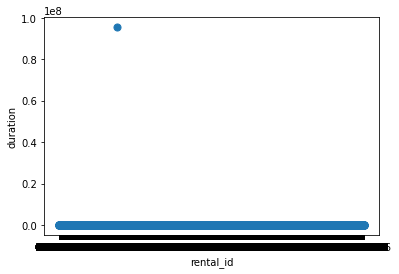

In [536]:
rides_data_without_duplicates.plot.scatter(x='rental_id',y='duration',s=50)

In [537]:
duration_75_percentile_value =  rides_data_without_duplicates['duration'].describe()['75%']
rides_data_without_duplicates.loc[rides_data_without_duplicates['duration'] > duration_75_percentile_value,'duration'] = duration_75_percentile_value 

<AxesSubplot:xlabel='rental_id', ylabel='duration'>

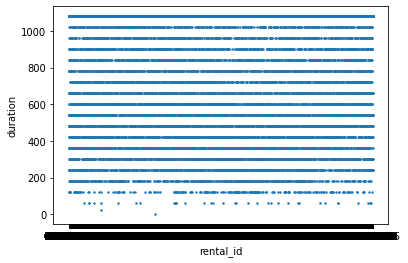

In [352]:
rides_data_without_duplicates.plot.scatter(x='rental_id',y='duration',s=2)

In [538]:
rides_data_without_duplicates['duration_bin']=pd.cut(rides_data_without_duplicates['duration'], 30).astype(str)


In [539]:
duration_ranges_dict = pd.cut(rides_data_without_duplicates['duration'], 30).value_counts().sort_index().to_dict()
duration_ranges = list(map(lambda interval : {'left': interval.left,'right':interval.right,'value':duration_ranges_dict[interval]},list(duration_ranges_dict.keys())))
duration_ranges

[{'left': -0.079, 'right': 36.967, 'value': 2},
 {'left': 36.967, 'right': 72.933, 'value': 35},
 {'left': 72.933, 'right': 108.9, 'value': 0},
 {'left': 108.9, 'right': 144.867, 'value': 210},
 {'left': 144.867, 'right': 180.833, 'value': 477},
 {'left': 180.833, 'right': 216.8, 'value': 0},
 {'left': 216.8, 'right': 252.767, 'value': 708},
 {'left': 252.767, 'right': 288.733, 'value': 0},
 {'left': 288.733, 'right': 324.7, 'value': 849},
 {'left': 324.7, 'right': 360.667, 'value': 909},
 {'left': 360.667, 'right': 396.633, 'value': 0},
 {'left': 396.633, 'right': 432.6, 'value': 948},
 {'left': 432.6, 'right': 468.567, 'value': 0},
 {'left': 468.567, 'right': 504.533, 'value': 944},
 {'left': 504.533, 'right': 540.5, 'value': 898},
 {'left': 540.5, 'right': 576.467, 'value': 0},
 {'left': 576.467, 'right': 612.433, 'value': 911},
 {'left': 612.433, 'right': 648.4, 'value': 0},
 {'left': 648.4, 'right': 684.367, 'value': 814},
 {'left': 684.367, 'right': 720.333, 'value': 766},
 {'lef

<AxesSubplot:xlabel='duration_bin'>

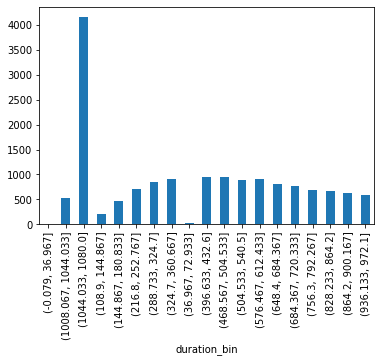

In [540]:
rides_data_with_duration_bins = rides_data_without_duplicates.groupby('duration_bin').duration_bin.count()
# Fixed to show distribution of bin
rides_data_with_duration_bins.plot(kind='bar')

### Top 20 Map

In [541]:
start_station_freq_dict = rides_data_without_duplicates['start_station_id'].sort_values().value_counts().to_dict()
end_station_freq_dict = rides_data_without_duplicates['end_station_id'].sort_values().value_counts().to_dict()

In [542]:
freq_dict = {int(k): start_station_freq_dict.get(k, 0) + end_station_freq_dict.get(k, 0) for k in set(start_station_freq_dict) | set(end_station_freq_dict)}

In [543]:
sorted_dict = {k: v for k, v in sorted(freq_dict.items(), key=lambda item: -item[1])}
top_20 = list(sorted_dict.keys())[:20]
top_20



[154,
 14,
 374,
 217,
 101,
 194,
 55,
 41,
 66,
 427,
 341,
 361,
 251,
 104,
 71,
 199,
 732,
 132,
 215,
 191]

In [544]:
def add_station_access_count(station_details):
    station_details['access_count'] = sorted_dict[station_details['id']]
    return station_details

In [545]:
top_20_stations = station_data[station_data['id'].isin(top_20)]
top_20_stations = top_20_stations.apply(add_station_access_count,1)
top_20_stations = top_20_stations.sort_values('access_count', ascending=False)
top_20_stations_dict = top_20_stations[['id','name','latitude','longitude','access_count']].to_dict('records')
top_20_stations_dict

[{'id': 154,
  'name': 'Waterloo Station 3, Waterloo',
  'latitude': 51.50379168,
  'longitude': -0.11282408,
  'access_count': 495},
 {'id': 14,
  'name': "Belgrove Street , King's Cross",
  'latitude': 51.52994371,
  'longitude': -0.123616824,
  'access_count': 481},
 {'id': 374,
  'name': 'Waterloo Station 1, Waterloo',
  'latitude': 51.50402794,
  'longitude': -0.11386436,
  'access_count': 241},
 {'id': 217,
  'name': 'Wormwood Street, Liverpool Street',
  'latitude': 51.51615461,
  'longitude': -0.082422399,
  'access_count': 207},
 {'id': 101,
  'name': 'Queen Street 1, Bank',
  'latitude': 51.51155322,
  'longitude': -0.0929401,
  'access_count': 198},
 {'id': 194,
  'name': 'Hop Exchange, The Borough',
  'latitude': 51.50462759,
  'longitude': -0.091773776,
  'access_count': 192},
 {'id': 55,
  'name': 'Finsbury Circus, Liverpool Street',
  'latitude': 51.51707521,
  'longitude': -0.086685542,
  'access_count': 182},
 {'id': 41,
  'name': 'Pindar Street, Liverpool Street',
  '

### Top Ten with stations

In [546]:
import re

date_pattern = '\d{4}-(?:0[1-9]|1[0-2])-(?:0[1-9]|[1-2]\d|3[0-1])\s(?:[0-1]\d|2[0-3]):[0-5]\d:[0-5]\d\sUTC'

def ensure_data_validity(ride_details):
    are_dates_valid = bool(re.match(date_pattern,ride_details['start_date'])) and bool(re.match(date_pattern,ride_details['end_date']))    
    return ride_details if are_dates_valid else 'NA'

In [548]:
rides_data_without_duplicates = rides_data_without_duplicates.apply(ensure_data_validity,1)

In [549]:
rides_data_without_duplicates[rides_data_without_duplicates['start_date'] == 'NA']

,rental_id,duration,bike_id,end_date,end_station_id,end_station_name,start_date,start_station_id,start_station_name,duration_bin
4581,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


In [550]:
rides_data_without_duplicates = rides_data_without_duplicates[rides_data_without_duplicates['start_date'] != 'NA']
rides_data_without_duplicates[rides_data_without_duplicates['start_date'] == 'NA']

,rental_id,duration,bike_id,end_date,end_station_id,end_station_name,start_date,start_station_id,start_station_name,duration_bin


### Other

In [51]:
def get_station_name_by_id(station_details):
    station_details['start_station_name'] = station_data.loc[station_data['id'] == int(station_details['start_station_id']),'name'].to_string()
    station_details['end_station_name'] = station_data.loc[station_data['id'] == int(station_details['end_station_id']),'name'].to_string()
    print(station_details)
    return station_details

In [52]:
rides_data_without_duplicates = rides_data_without_duplicates.apply(get_station_name_by_id, 1)

rental_id                                            64997353
duration                                                  240
bike_id                                                  7799
end_date                              2017-05-15 05:52:00 UTC
end_station_id                                            803
end_station_name            644    Southwark Street, Bankside
start_date                            2017-05-15 05:48:00 UTC
start_station_id                                          125
start_station_name    572    Borough High Street, The Borough
Name: 0, dtype: object
rental_id                                       64997354
duration                                             780
bike_id                                            14411
end_date                         2017-05-15 06:01:00 UTC
end_station_id                                        71
end_station_name      338    Newgate Street , St. Paul's
start_date                       2017-05-15 05:48:00 UTC
start_station_id    

rental_id                                 64998126
duration                                       360
bike_id                                       7939
end_date                   2017-05-15 07:08:00 UTC
end_station_id                                 331
end_station_name      714    Bunhill Row, Moorgate
start_date                 2017-05-15 07:02:00 UTC
start_station_id                               101
start_station_name     676    Queen Street 1, Bank
Name: 747, dtype: object
rental_id                                     64998127
duration                                           420
bike_id                                           2686
end_date                       2017-05-15 07:09:00 UTC
end_station_id                                     703
end_station_name      331    St. Bride Street, Holborn
start_date                     2017-05-15 07:02:00 UTC
start_station_id                                   351
start_station_name    141    Macclesfield Rd, St Lukes
Name: 748, dtype: obj

rental_id                                             64998368
duration                                                   900
bike_id                                                   8935
end_date                               2017-05-15 07:27:00 UTC
end_station_id                                              55
end_station_name      768    Finsbury Circus, Liverpool Street
start_date                             2017-05-15 07:12:00 UTC
start_station_id                                           361
start_station_name         344    Waterloo Station 2, Waterloo
Name: 975, dtype: object
rental_id                                       64998369
duration                                             720
bike_id                                             4932
end_date                         2017-05-15 07:24:00 UTC
end_station_id                                       104
end_station_name                 771    Crosswall, Tower
start_date                       2017-05-15 07:12:00 UTC
start_sta

rental_id                                             64999507
duration                                                   900
bike_id                                                   5894
end_date                               2017-05-15 07:58:00 UTC
end_station_id                                              64
end_station_name              660    William IV Street, Strand
start_date                             2017-05-15 07:43:00 UTC
start_station_id                                            55
start_station_name    768    Finsbury Circus, Liverpool Street
Name: 2043, dtype: object
rental_id                                      64999508
duration                                            960
bike_id                                             143
end_date                        2017-05-15 07:59:00 UTC
end_station_id                                      256
end_station_name         432    Houghton Street, Strand
start_date                      2017-05-15 07:43:00 UTC
start_station_i

rental_id                                           65000265
duration                                                 360
bike_id                                                14521
end_date                             2017-05-15 08:06:00 UTC
end_station_id                                            41
end_station_name      716    Pindar Street, Liverpool Street
start_date                           2017-05-15 08:00:00 UTC
start_station_id                                          31
start_station_name             306    Fanshaw Street, Hoxton
Name: 2755, dtype: object
rental_id                                       65000266
duration                                             840
bike_id                                             4833
end_date                         2017-05-15 08:14:00 UTC
end_station_id                                       190
end_station_name         165    Rampayne Street, Pimlico
start_date                       2017-05-15 08:00:00 UTC
start_station_id          

rental_id                                       65001571
duration                                            1140
bike_id                                             7030
end_date                         2017-05-15 08:45:00 UTC
end_station_id                                       109
end_station_name               430    Soho Square , Soho
start_date                       2017-05-15 08:26:00 UTC
start_station_id                                      51
start_station_name    298    Finsbury Library , Finsbury
Name: 3986, dtype: object
rental_id                                          65001572
duration                                               1080
bike_id                                                 598
end_date                            2017-05-15 08:44:00 UTC
end_station_id                                            2
end_station_name      611    Phillimore Gardens, Kensington
start_date                          2017-05-15 08:26:00 UTC
start_station_id                         

rental_id                                            65002738
duration                                                  420
bike_id                                                 14834
end_date                              2017-05-15 08:54:00 UTC
end_station_id                                            392
end_station_name       544    Imperial College, Knightsbridge
start_date                            2017-05-15 08:47:00 UTC
start_station_id                                          375
start_station_name    118    Kensington Town Hall, Kensington
Name: 5068, dtype: object
rental_id                                  65002739
duration                                        480
bike_id                                        6746
end_date                    2017-05-15 08:55:00 UTC
end_station_id                                   42
end_station_name       227    Wenlock Road , Hoxton
start_date                  2017-05-15 08:47:00 UTC
start_station_id                                539


rental_id                                      65003437
duration                                           1020
bike_id                                            6297
end_date                        2017-05-15 09:21:00 UTC
end_station_id                                      143
end_station_name      701    Pont Street, Knightsbridge
start_date                      2017-05-15 09:04:00 UTC
start_station_id                                     86
start_station_name     292    Sancroft Street, Vauxhall
Name: 5742, dtype: object
rental_id                                65003438
duration                                     1980
bike_id                                      5837
end_date                  2017-05-15 09:37:00 UTC
end_station_id                                 65
end_station_name      509    Gower Place , Euston
start_date                2017-05-15 09:04:00 UTC
start_station_id                              470
start_station_name       655    Mostyn Grove, Bow
Name: 5743, dtype: o

rental_id                                          65004205
duration                                                480
bike_id                                                3170
end_date                            2017-05-15 09:38:00 UTC
end_station_id                                           88
end_station_name          741    Bayley Street , Bloomsbury
start_date                          2017-05-15 09:30:00 UTC
start_station_id                                         14
start_station_name    242    Belgrove Street , King's Cross
Name: 6470, dtype: object
rental_id                                       65004206
duration                                             960
bike_id                                            11458
end_date                         2017-05-15 09:46:00 UTC
end_station_id                                       236
end_station_name      268    Fashion Street, Whitechapel
start_date                       2017-05-15 09:30:00 UTC
start_station_id                   

rental_id                                         65006311
duration                                               180
bike_id                                               9392
end_date                           2017-05-15 12:27:00 UTC
end_station_id                                         166
end_station_name      578    Seville Street, Knightsbridge
start_date                         2017-05-15 12:24:00 UTC
start_station_id                                       191
start_station_name      554    Hyde Park Corner, Hyde Park
Name: 8469, dtype: object
rental_id                                     65006312
duration                                          1380
bike_id                                          14086
end_date                       2017-05-15 12:47:00 UTC
end_station_id                                     268
end_station_name        453    Belgrave Road, Victoria
start_date                     2017-05-15 12:24:00 UTC
start_station_id                                   360
sta

rental_id                                               65006553
duration                                                     660
bike_id                                                    12213
end_date                                 2017-05-15 12:52:00 UTC
end_station_id                                               719
end_station_name      502    Victoria Park Road, Hackney Central
start_date                               2017-05-15 12:41:00 UTC
start_station_id                                              40
start_station_name          536    Commercial Street, Shoreditch
Name: 8695, dtype: object
rental_id                                       65006555
duration                                             840
bike_id                                            10895
end_date                         2017-05-15 12:55:00 UTC
end_station_id                                       641
end_station_name      623    Archbishop's Park, Waterloo
start_date                       2017-05-15 12:

rental_id                                            65009531
duration                                                 1140
bike_id                                                 12957
end_date                              2017-05-15 15:43:00 UTC
end_station_id                                            411
end_station_name      733    Walworth Road, Elephant & Castle
start_date                            2017-05-15 15:24:00 UTC
start_station_id                                           33
start_station_name               34    Central House, Aldgate
Name: 11494, dtype: object
rental_id                                       65009532
duration                                            1440
bike_id                                              294
end_date                         2017-05-15 15:48:00 UTC
end_station_id                                        88
end_station_name       741    Bayley Street , Bloomsbury
start_date                       2017-05-15 15:24:00 UTC
start_station_id

rental_id                                  65010066
duration                                       2760
bike_id                                        8929
end_date                    2017-05-15 16:36:00 UTC
end_station_id                                  303
end_station_name      710    Albert Gate, Hyde Park
start_date                  2017-05-15 15:50:00 UTC
start_station_id                                303
start_station_name    710    Albert Gate, Hyde Park
Name: 11998, dtype: object
rental_id                                          65010067
duration                                                480
bike_id                                                2413
end_date                            2017-05-15 15:58:00 UTC
end_station_id                                          553
end_station_name           443    Regent's Row , Haggerston
start_date                          2017-05-15 15:50:00 UTC
start_station_id                                        132
start_station_name    240

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



rental_id                                               65011977
duration                                                     300
bike_id                                                      812
end_date                                 2017-05-15 17:01:00 UTC
end_station_id                                               307
end_station_name      166    Black Lion Gate, Kensington Gardens
start_date                               2017-05-15 16:56:00 UTC
start_station_id                                             165
start_station_name              113    Orsett Terrace, Bayswater
Name: 13825, dtype: object
rental_id                                            65011978
duration                                                  900
bike_id                                                   469
end_date                              2017-05-15 17:12:00 UTC
end_station_id                                            613
end_station_name      643    Woodstock Grove, Shepherd's Bush
start_date      

rental_id                                         65013022
duration                                              1260
bike_id                                               7245
end_date                           2017-05-15 17:36:00 UTC
end_station_id                                         809
end_station_name      649    Lincoln's Inn Fields, Holborn
start_date                         2017-05-15 17:15:00 UTC
start_station_id                                       506
start_station_name      491    Bell Lane, Liverpool Street
Name: 14812, dtype: object
rental_id                                               65013023
duration                                                     240
bike_id                                                     3461
end_date                                 2017-05-15 17:19:00 UTC
end_station_id                                               203
end_station_name      532    West Smithfield Rotunda, Farringdon
start_date                               2017-05-15 

rental_id                                        65013990
duration                                              360
bike_id                                              8675
end_date                          2017-05-15 17:36:00 UTC
end_station_id                                        703
end_station_name         331    St. Bride Street, Holborn
start_date                        2017-05-15 17:30:00 UTC
start_station_id                                       72
start_station_name    404    Farringdon Lane, Clerkenwell
Name: 15744, dtype: object
rental_id                                               65013991
duration                                                     240
bike_id                                                    11304
end_date                                 2017-05-15 17:34:00 UTC
end_station_id                                               251
end_station_name      693    Brushfield Street, Liverpool Street
start_date                               2017-05-15 17:30:00 

rental_id                                             65014185
duration                                                   600
bike_id                                                   7286
end_date                               2017-05-15 17:43:00 UTC
end_station_id                                             360
end_station_name              747    Howick Place, Westminster
start_date                             2017-05-15 17:33:00 UTC
start_station_id                                           324
start_station_name    370    Ontario Street, Elephant & Castle
Name: 15935, dtype: object
rental_id                                        65014186
duration                                              600
bike_id                                             13225
end_date                          2017-05-15 17:43:00 UTC
end_station_id                                        516
end_station_name      513    Chrisp Street Market, Poplar
start_date                        2017-05-15 17:33:00 UTC


In [268]:
print(rides_data_without_duplicates.dtypes,rides_data_without_duplicates.isna().sum(),rides_data_without_duplicates.duplicated('rental_id').value_counts())

rental_id             object
duration              object
bike_id               object
end_date              object
end_station_id         int64
end_station_name      object
start_date            object
start_station_id       int64
start_station_name    object
dtype: object rental_id             0
duration              0
bike_id               0
end_date              0
end_station_id        0
end_station_name      1
start_date            0
start_station_id      0
start_station_name    1
dtype: int64 False    15735
dtype: int64


In [284]:
rides_data_without_duplicates = rides_data_without_duplicates[rides_data_without_duplicates['end_station_name'].notna()]
rides_data_without_duplicates = rides_data_without_duplicates[rides_data_without_duplicates['start_station_name'].notna()]
rides_data_without_duplicates = rides_data_without_duplicates[rides_data_without_duplicates['end_station_id'].notna()]
rides_data_without_duplicates = rides_data_without_duplicates[rides_data_without_duplicates['end_station_id'].notna()]
rides_data_without_duplicates = rides_data_without_duplicates[rides_data_without_duplicates['start_station_name'] != 'Adress is missing']

In [285]:
print(rides_data_without_duplicates.dtypes,rides_data_without_duplicates.isna().sum(),rides_data_without_duplicates.duplicated('rental_id').value_counts())

rental_id             object
duration              object
bike_id               object
end_date              object
end_station_id         int64
end_station_name      object
start_date            object
start_station_id       int64
start_station_name    object
dtype: object rental_id             0
duration              0
bike_id               0
end_date              0
end_station_id        0
end_station_name      0
start_date            0
start_station_id      0
start_station_name    0
dtype: int64 False    15733
dtype: int64


In [279]:
print(rides_data_without_duplicates)

      rental_id duration bike_id                 end_date  end_station_id  \
0      64997353      240    7799  2017-05-15 05:52:00 UTC             803   
1      64997354      780   14411  2017-05-15 06:01:00 UTC              71   
2      64997355     2640    2815  2017-05-15 06:32:00 UTC             360   
3      64997356      540    6751  2017-05-15 05:57:00 UTC             817   
4      64997357      540   11456  2017-05-15 05:58:00 UTC             233   
...         ...      ...     ...                      ...             ...   
15999  65002228     1440    1811  2017-05-15 09:02:00 UTC             404   
16000  65013306      480   13282  2017-05-15 17:27:00 UTC              39   
16001  65014250      660    5817  2017-05-15 17:45:00 UTC             540   
16002  65014251     1320    4205  2017-05-15 17:56:00 UTC             784   
16003  65014252     1080   14940  2017-05-15 17:52:00 UTC             101   

                                 end_station_name               start_date 